In [ ]:
import os

import json
import numpy as np
import pandas as pd

import cv2
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

In [ ]:
DATA_SRC = '/content/drive/MyDrive/Colab-Notebooks/data/zalo-traffic-sign/za_traffic_2020/traffic_train'

In [ ]:
os.chdir(DATA_SRC)
os.listdir()

['annotation.csv',
 'images',
 'sample_images',
 'train_traffic_sign_dataset.json']

### ```train_traffic_sign_dataset.json``` is the whole dataset with ```4``` tables

In [ ]:
with open(os.path.join(DATA_SRC, 'train_traffic_sign_dataset.json')) as data:
    train_data = json.loads(data.read())

print("info: {}".format(train_data['info'].keys()))
print("annotations: {}".format(train_data['annotations'][0].keys()))
print("categories: {}".format(train_data['categories'][0].keys()))
print("images: {}".format(train_data['images'][0].keys()))

info: dict_keys(['description', 'url', 'version', 'year', 'contributor', 'date_created'])
annotations: dict_keys(['segmentation', 'area', 'iscrowd', 'image_id', 'bbox', 'category_id', 'id'])
categories: dict_keys(['supercategory', 'supercategory_eng', 'id', 'name'])
images: dict_keys(['file_name', 'height', 'width', 'id', 'street_id'])


In [ ]:
pd.merge(
    pd.merge(
        pd.DataFrame.from_dict(train_data['images']),
        pd.DataFrame.from_dict(train_data['annotations']),
        left_on=['id'], right_on=['image_id']
    ),
    pd.DataFrame.from_dict(train_data['categories']),
    left_on=['category_id'], right_on=['id']
)[['image_id', 'file_name', 'height', 'width', 'id_y', 'bbox', 'category_id', 'supercategory', 'supercategory_eng']].rename(
    {'id_y':'bbox_id'}, 
    axis='columns'
).to_csv(os.path.join(DATA_SRC, 'annotation.csv'), index=False)

### ```annotation.csv``` is the join of 3 tables ```annotations```, ```categories```, ```images```

In [ ]:
annotation = pd.read_csv(os.path.join(DATA_SRC, 'annotation.csv'))
display(annotation)
display(annotation.info())
display(annotation.describe())

,image_id,file_name,height,width,bbox_id,bbox,category_id,supercategory,supercategory_eng
0,3,3.png,626,1622,0,"[880, 333, 19, 18]",2,Cấm dừng và đỗ,No stopping and parking
1,5,5.png,626,1622,2,"[768, 480, 9, 7]",2,Cấm dừng và đỗ,No stopping and parking
2,16,16.png,626,1622,4,"[733, 352, 7, 8]",2,Cấm dừng và đỗ,No stopping and parking
3,17,17.png,626,1622,5,"[1024, 160, 75, 72]",2,Cấm dừng và đỗ,No stopping and parking
4,18,18.png,626,1622,6,"[1138, 295, 47, 41]",2,Cấm dừng và đỗ,No stopping and parking
...,...,...,...,...,...,...,...,...,...
10995,12442,12442.png,626,1622,10951,"[507, 368, 15, 13]",7,Hiệu lệnh,Mandatory
10996,12447,12447.png,626,1622,10966,"[358, 330, 61, 54]",7,Hiệu lệnh,Mandatory
10997,12473,12473.png,626,1622,10976,"[356, 289, 17, 14]",7,Hiệu lệnh,Mandatory
10998,12503,12503.png,626,1622,10991,"[552, 227, 47, 47]",7,Hiệu lệnh,Mandatory


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11000 entries, 0 to 10999
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   image_id           11000 non-null  int64 
 1   file_name          11000 non-null  object
 2   height             11000 non-null  int64 
 3   width              11000 non-null  int64 
 4   bbox_id            11000 non-null  int64 
 5   bbox               11000 non-null  object
 6   category_id        11000 non-null  int64 
 7   supercategory      11000 non-null  object
 8   supercategory_eng  11000 non-null  object
dtypes: int64(5), object(4)
memory usage: 773.6+ KB


None

,image_id,height,width,bbox_id,category_id
count,11000.000000,11000.0,11000.0,11000.000000,11000.000000
mean,7047.941455,626.0,1622.0,5499.900182,4.155000
std,3176.417125,0.0,0.0,3175.986599,2.024954
min,3.000000,626.0,1622.0,0.000000,1.000000
25%,4676.000000,626.0,1622.0,2749.750000,2.000000
50%,7039.000000,626.0,1622.0,5499.500000,5.000000
75%,9792.000000,626.0,1622.0,8250.250000,6.000000
max,12523.000000,626.0,1622.0,11000.000000,7.000000


In [ ]:
print("classes: \n{}\n".format(annotation['supercategory'].unique()))
print("len = {}\n".format(annotation['supercategory'].unique().shape[0]))
print("n_samples per class: \n{}\n".format(annotation['supercategory'].value_counts()))

classes: 
['Cấm dừng và đỗ' 'Cấm rẽ' 'Nguy hiểm' 'Cấm còn lại' 'Giới hạn tốc độ'
 'Cấm ngược chiều' 'Hiệu lệnh']

len = 7

n_samples per class: 
Nguy hiểm          3049
Cấm dừng và đỗ     2221
Cấm còn lại        1787
Cấm ngược chiều    1416
Hiệu lệnh          1022
Giới hạn tốc độ     949
Cấm rẽ              556
Name: supercategory, dtype: int64



In [ ]:
def pie_chart(feature, chart_title, data):
    data[feature].value_counts().plot.pie(
            title = chart_title, 
            autopct=lambda p: "{:.2f}%".format(p)
    )

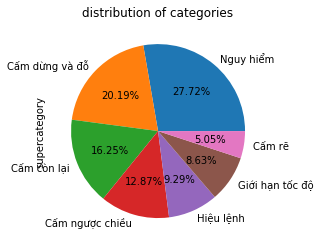

In [ ]:
pie_chart('supercategory', 'distribution of categories', annotation)

### plot some random images with bbox and save them to storage

In [ ]:
BOX_COLOR = (100, 255, 0) 
TEXT_COLOR = (255, 255, 255)

def visualize_bbox(
    img,
    bbox,
    class_name,
    color=BOX_COLOR,
    thickness=2,
    font=r'/content/Lato Semibold.ttf',
    format='pascal_voc',
    implementation='pil'
    ):
    """Visualizes a single bounding box on the image"""
    x_min = None
    y_min = None 
    x_max = None
    y_max = None
    if (format == 'coco'):
        x_min, y_min, w, h = bbox
        x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
    
    elif (format == 'pascal_voc'):
        x_min, y_min, x_max, y_max = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])
    
    if (implementation == 'cv2'):
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
        
        ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)    
        cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), color, -1)
        cv2.putText(
            img,
            text=class_name,
            org=(x_min, y_min - int(0.3 * text_height)),
            fontFace=cv2.FONT_HERSHEY_SIMPLEX,
            fontScale=0.5, 
            color=TEXT_COLOR, 
            lineType=cv2.LINE_AA,
        )
    
    elif (implementation == 'pil'):
        if isinstance(img, np.ndarray):
            img = Image.fromarray(img)
        draw = ImageDraw.Draw(img)

        draw.rectangle([(x_min, y_min), (x_max, y_max)], fill=None, outline=color, width=thickness)

        font_text = ImageFont.truetype(font=font, size=20)
        text_width, text_height = font_text.getsize(class_name)
        draw.rectangle([(x_min, y_min - int(1.3 * text_height)) , (x_min + text_width, y_min)], fill=color)
        draw.text((x_min, y_min - int(1.3 * text_height)), class_name, TEXT_COLOR, font=font_text)
        img = np.asarray(img)

    return img


def visualize(image, bboxes, labels, file_name, format, implementation):
    img = image.copy()
    for bbox, label in zip(bboxes, labels):
        img = visualize_bbox(img=img, bbox=bbox, class_name=label, format=format, implementation=implementation)
    plt.figure(figsize=(12, 12))
    plt.title('{}'.format(file_name))
    plt.axis('off')
    plt.imshow(img)

    return img

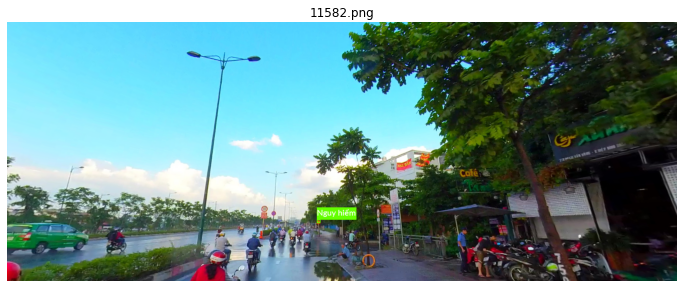

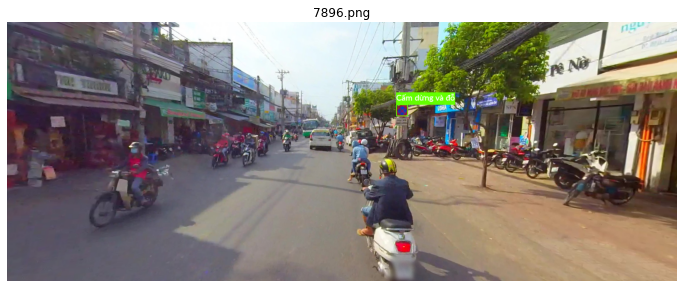

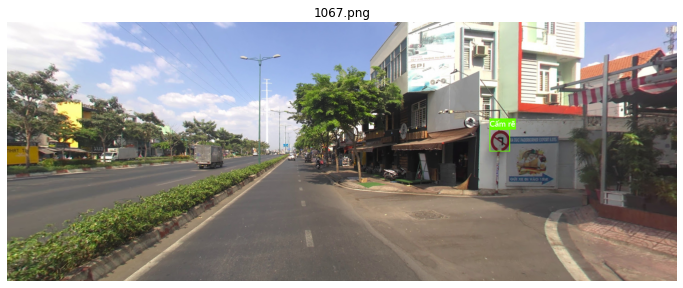

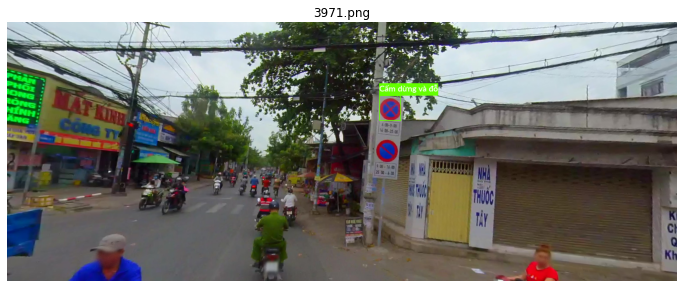

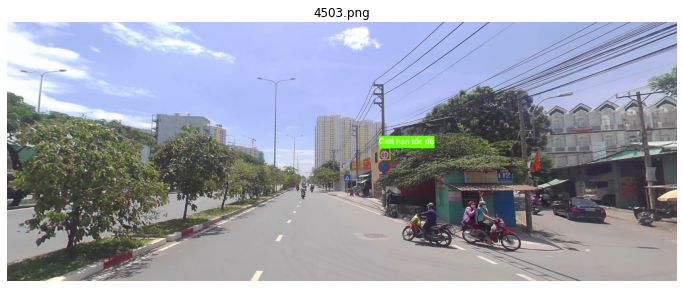

...

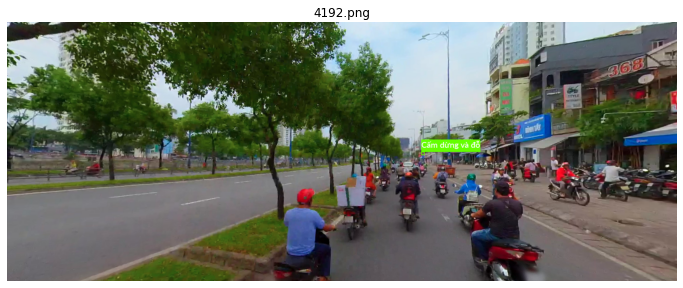

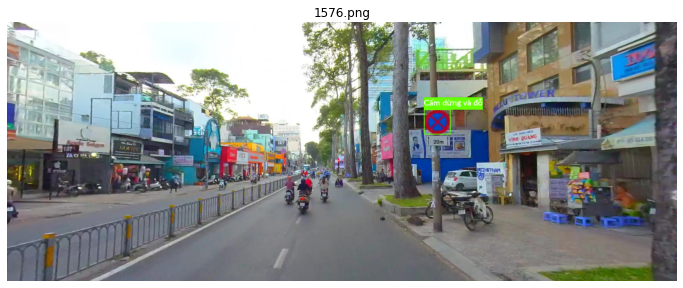

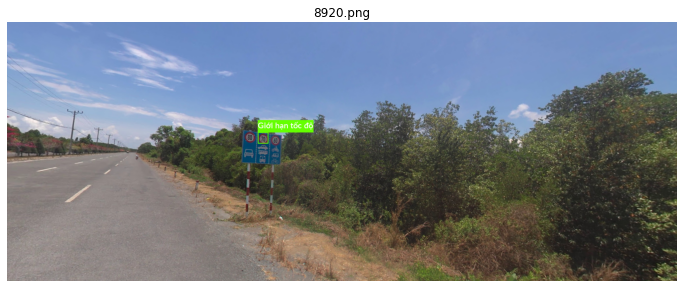

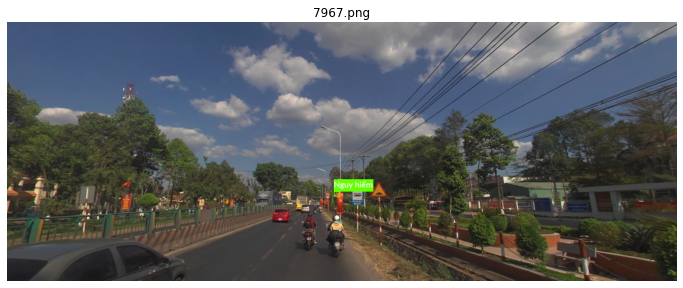

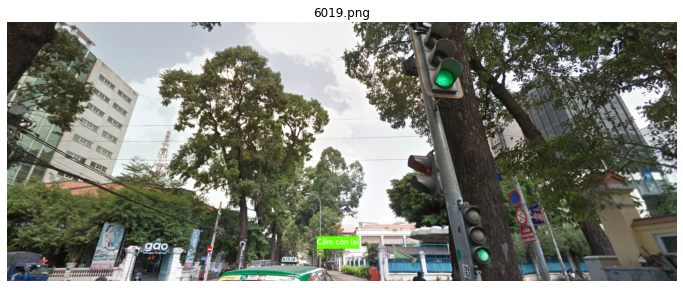

In [ ]:
N_IMGS = 20

for _ in range(0, N_IMGS):
    annotation_sample = annotation.sample()
    img = cv2.imread(os.path.join(DATA_SRC, 'images', annotation_sample['file_name'].values[0]))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    bbox_img = visualize(
        img,
        [json.loads(bbox) for bbox in annotation_sample['bbox'].values],
        [label for label in annotation_sample['supercategory'].values],
        annotation_sample['file_name'].values[0],
        'coco',
        'pil'
    )
    cv2.imwrite(os.path.join(DATA_SRC, 'sample_images', annotation_sample['file_name'].values[0]), cv2.cvtColor(bbox_img, cv2.COLOR_RGB2BGR))

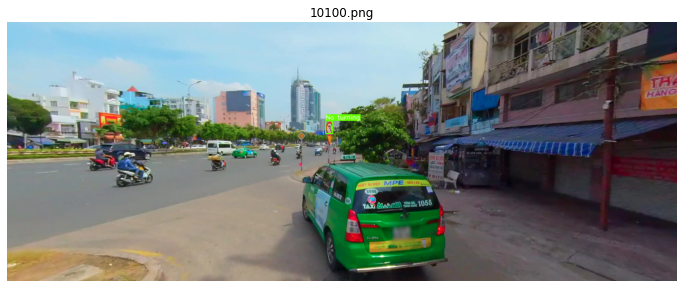

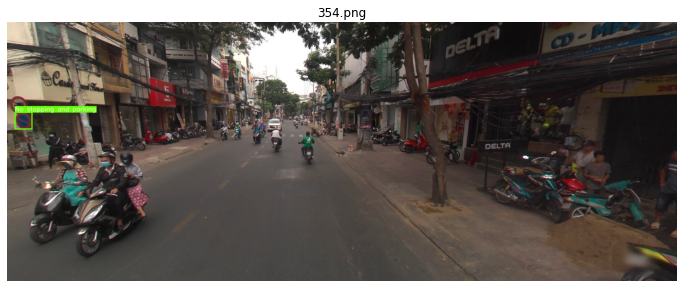

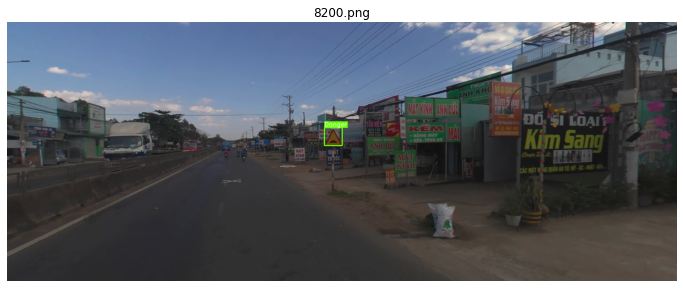

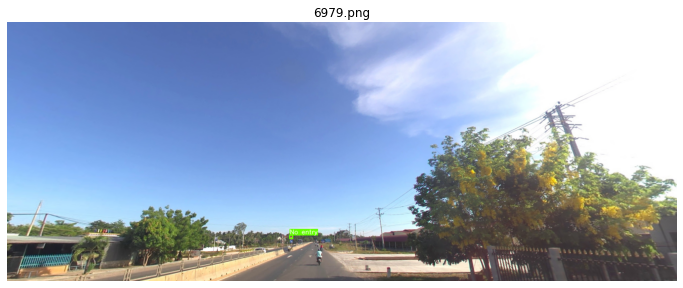

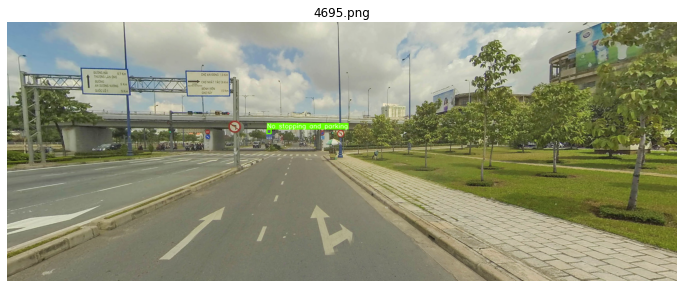

...

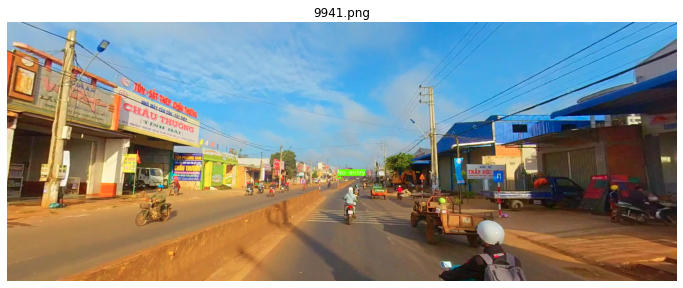

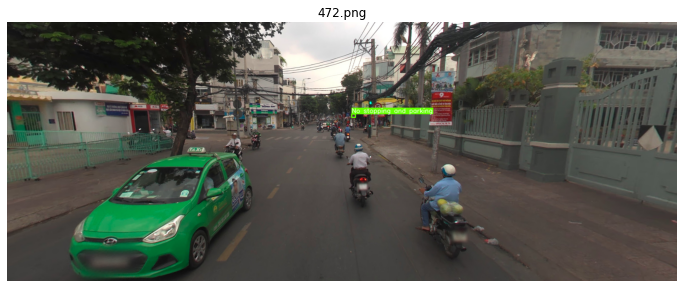

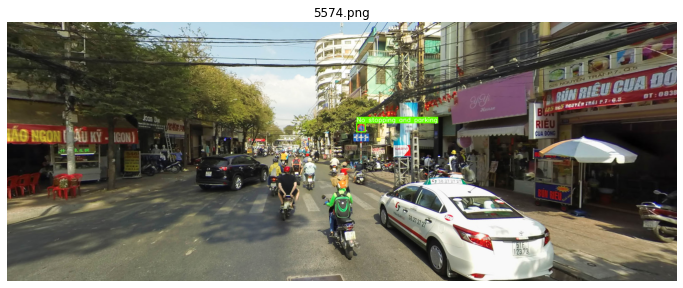

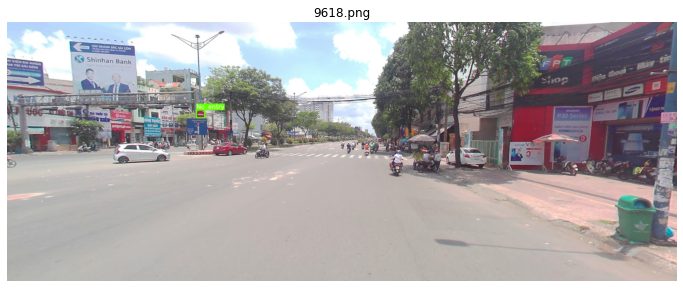

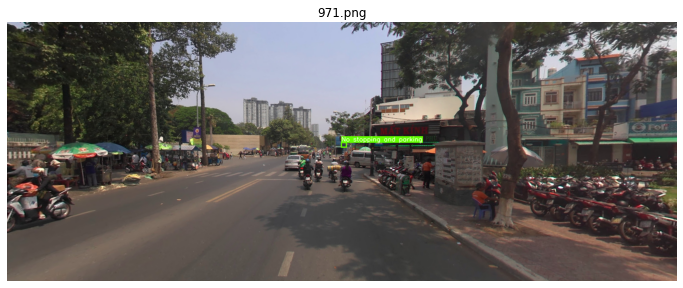

In [ ]:
N_IMGS = 20

for _ in range(0, N_IMGS):
    annotation_sample = annotation.sample()
    img = cv2.imread(os.path.join(DATA_SRC, 'images', annotation_sample['file_name'].values[0]))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    bbox_img = visualize(
        img,
        [json.loads(bbox) for bbox in annotation_sample['bbox'].values],
        [label for label in annotation_sample['supercategory_eng'].values],
        annotation_sample['file_name'].values[0],
        'coco',
        'cv2'
    )
    cv2.imwrite(os.path.join(DATA_SRC, 'sample_images', annotation_sample['file_name'].values[0]), cv2.cvtColor(bbox_img, cv2.COLOR_RGB2BGR))